<a href="https://colab.research.google.com/github/randy8912/ML_Data_science/blob/main/Dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier usinf TensorFLow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities of each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set( these images have no labels, because we'll want to predict them).

### Get our workspace ready

* Import Tensowflow 2.X ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__)
print("TF Hub version", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version 2.15.0
TF Hub version 0.16.1
GPU available (YESSSS!!!!!)


## Getting our data ready (turning it into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representation).

Let's start by accesing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


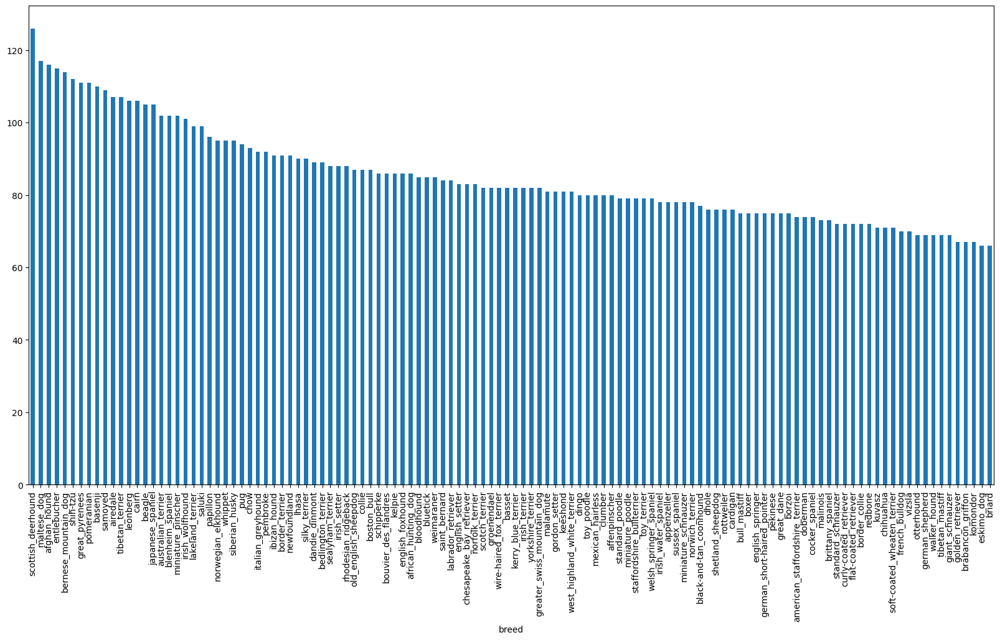

In [ ]:
# How many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

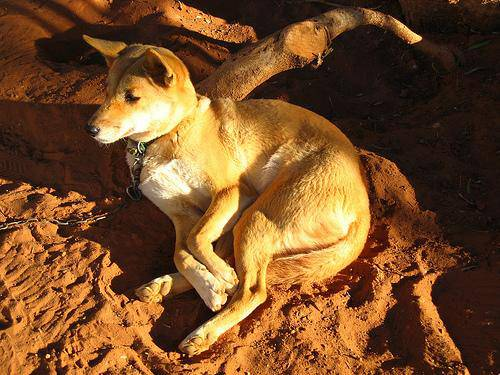

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's.
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")


Filenames match actual amount of files!!! Proceed.


In [ ]:
len(filenames)

10222

In [ ]:
import os

folder_path = '/content/drive/MyDrive/Dog Vision/train/'  # Adjust the path accordingly

# Get the list of files in the folder
files = os.listdir(folder_path)

# Count the number of files
num_files = len(files)

print("Number of files in the folder:", num_files)

Number of files in the folder: 10222


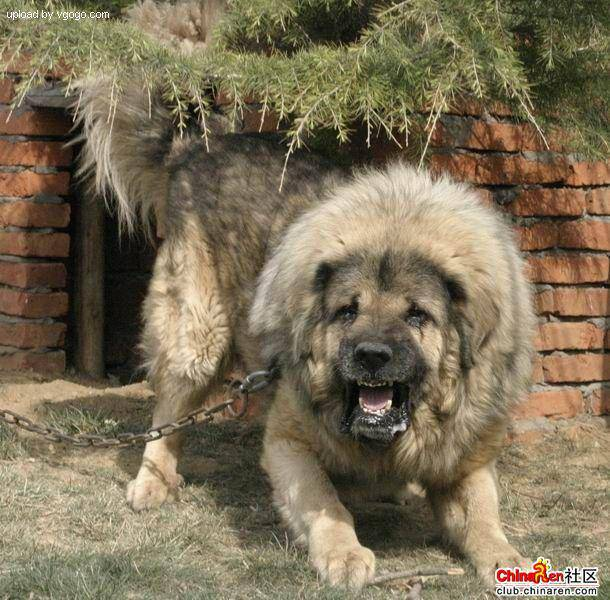

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # Does the same thing as above
labels


array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of Booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(labels)

10222

In [ ]:
# Turn every label into a Boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning Boolean array into integers
print(labels[0]) # Original labels
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X &y labels
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size=0.2,
                                                   random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensort we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensowFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1.
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert an image into a NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min(), image

(255,
 0,
 array([[[ 89, 137,  89],
         [ 76, 124,  76],
         [ 63, 111,  61],
         ...,
         [ 77, 133,  86],
         [ 76, 134,  86],
         [ 76, 134,  86]],
 
        [[ 72, 119,  75],
         [ 67, 114,  68],
         [ 63, 110,  64],
         ...,
         [ 75, 131,  84],
         [ 74, 132,  84],
         [ 74, 132,  84]],
 
        [[ 56, 104,  66],
         [ 58, 106,  68],
         [ 64, 112,  74],
         ...,
         [ 71, 127,  82],
         [ 73, 129,  84],
         [ 74, 130,  85]],
 
        ...,
 
        [[  2,  11,  10],
         [  5,  14,  11],
         [  8,  14,  14],
         ...,
         [120, 113,  67],
         [126, 118,  71],
         [122, 114,  67]],
 
        [[  0,   3,   7],
         [  2,   7,  10],
         [  3,   9,   7],
         ...,
         [105,  98,  54],
         [112, 104,  58],
         [111, 103,  57]],
 
        [[ 16,  18,  30],
         [ 16,  19,  24],
         [ 15,  20,  14],
         ...,
         [101,  92

In [ ]:
# Turn image into Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what a image looks like as a Tensor, ley's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensowFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1.
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, IMG_SIZE=IMG_SIZE):
  """
  Takes an image file path and turns the image into Tensors.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  #vConvert the color channel from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (244, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at the time (you can manually adjust the batch size if need be).

In order to use TensowFLow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and returns a type of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form :
`(image, label)`, let's make a function to turn all of our data (X & y) into batches!

In [ ]:
def create_data_batches(X, y, batch_size=32, valid_data=False, test_data=False):
    """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).
    """
    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))  # Only filepaths, no labels
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch

    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))  # filepaths, labels
        data_batch = data.map(get_image_label).batch(batch_size)
        return data_batch

    else:
        print("Creating training data batches...")
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))  # filepaths, labels
        # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
        data = data.shuffle(buffer_size=len(X))
        # Create (image, label) tuples (this also turns the image path into a preprocessed image)
        data = data.map(get_image_label)
        # Turn the training data into batches
        data_batch = data.batch(batch_size)
        return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attrivbutes of our data bacthes
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range (25):
    # Create subplots(5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as a title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

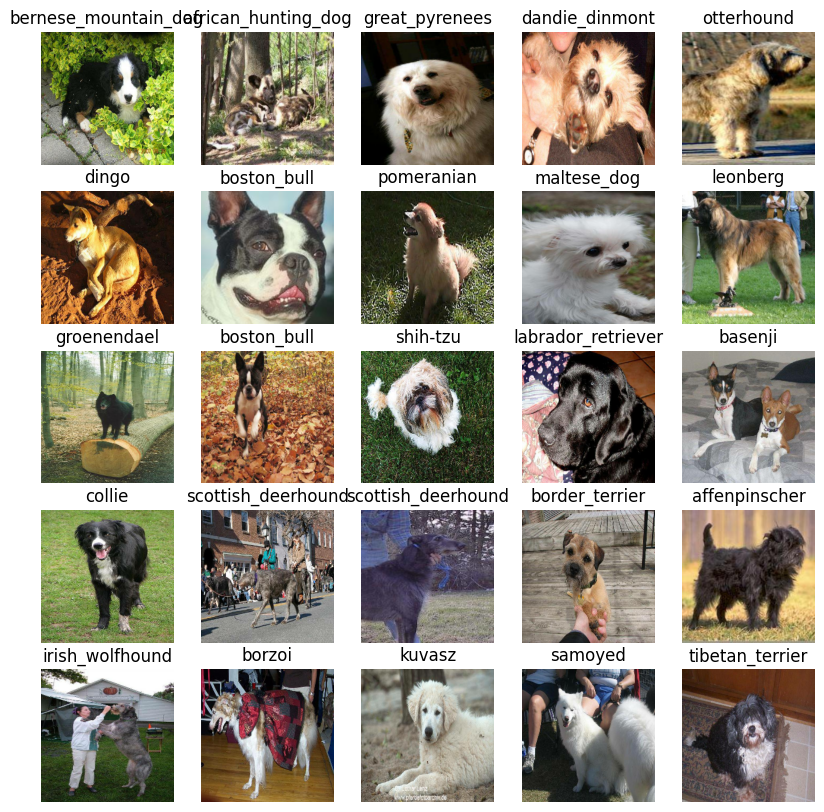

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

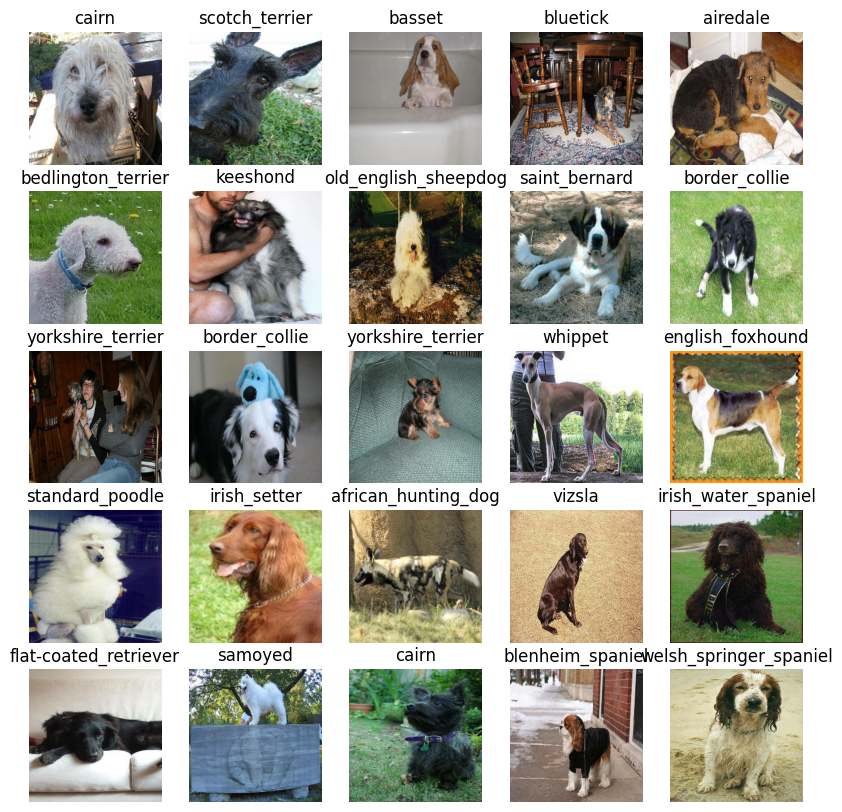

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use. - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Build the model (tells the model the input shape it will be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
from re import U
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building a model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save it's progress, check it's progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which tracks our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard Callback,we need to do 3 things. &#x2705;
1. Load the TensorBoard notebook extension. &#x2705;
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%TensorBoard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoards notebook extension
%load_ext tensorboard

In [ ]:
import datetime
import tensorflow as tf

def create_tensorboard_callback():
    """
    Creates a TensorBoard callback to store logs.
    """
    logdir = "logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

    return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we are still running on a GPU
print("GPU," "available (YESSS!!!!!)" if tf.config.list_logical_devices("GPU") else "not available :(")

GPU,available (YESSS!!!!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()`function on out model passing it the training data, number of epochs to train for (`NUM_EPOCHS`) and callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session every time we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model


In [ ]:
# Fit the model to the data
model = train_model()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 189s 7s/step - loss: 4.5876 - accuracy: 0.0975 - val_loss: 3.3898 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 153ms/step - loss: 1.6405 - accuracy: 0.6687 - val_loss: 2.1402 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 6s 239ms/step - loss: 0.5694 - accuracy: 0.9450 - val_loss: 1.6640 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 4s 154ms/step - loss: 0.2583 - accuracy: 0.9875 - val_loss: 1.4762 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 4s 180ms/step - loss: 0.1482 - accuracy: 0.9975 - val_loss: 1.3855 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 5s 216ms/step - loss: 0.1002 - accuracy: 0.9987 - val_loss: 1.3477 - val_accuracy: 0.6850
Epoch 7/100
25/25 [=============================

# Question:
It looks like out model is overfitting because it's performs far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

* Use a larger training set
* Use a smaller network
* Weight_sharing (as in convolutional neural networks)
* Early stopping
* Transfer learning

# Note:
Overfitting to begin with is a good thing! It means our model is learning!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data,
                            verbose=1)
predictions

7/7 [==============================] - 1s 120ms/step


array([[1.0000375e-03, 5.6879730e-05, 5.6063221e-04, ..., 1.7115462e-04,
        1.2223799e-04, 8.2145687e-03],
       [1.3566529e-04, 5.4539414e-03, 9.5582996e-03, ..., 6.9022528e-04,
        3.6251424e-03, 2.9495874e-04],
       [2.1831172e-05, 5.9304923e-05, 1.2127175e-04, ..., 1.4452035e-04,
        2.8553110e-04, 2.9529099e-04],
       ...,
       [3.8049024e-05, 7.1929244e-05, 5.1402503e-06, ..., 3.8721777e-05,
        8.7983196e-04, 9.3573735e-06],
       [5.3598913e-03, 3.2936284e-04, 3.3097170e-04, ..., 4.7632118e-04,
        2.5403828e-04, 9.8941866e-03],
       [4.7366053e-04, 3.3383042e-04, 9.4972091e-04, ..., 8.8430615e-03,
        6.1172014e-04, 4.2873726e-05]], dtype=float32)

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max Value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.81722241e-05 1.19976372e-04 6.53645257e-05 1.40558652e-04
 1.61338749e-03 1.60069438e-04 3.27841874e-04 8.32842779e-04
 1.04613630e-02 1.60389580e-02 1.51174581e-05 2.09510981e-05
 7.04814622e-04 5.60182333e-03 1.68881158e-03 7.84657151e-03
 3.72659379e-05 6.14824647e-04 2.31448066e-04 1.90338760e-04
 4.50843436e-05 3.02519795e-04 1.06558182e-04 2.63016933e-04
 1.39309950e-02 7.56397203e-05 1.50323714e-04 1.98256705e-04
 5.16053813e-04 1.69934094e-04 2.43931543e-04 2.94567231e-04
 5.23592425e-05 3.71878305e-05 5.75986851e-05 4.84761331e-05
 3.77333810e-04 1.17830210e-03 5.34321734e-05 8.21006298e-02
 2.19141890e-04 1.57654096e-04 7.22755305e-03 9.20264938e-06
 4.62253374e-04 1.92574342e-04 2.94104073e-04 1.63091230e-03
 8.45620161e-05 1.34137474e-04 7.11484827e-05 1.38681877e-04
 2.71774654e-04 2.17883545e-03 1.15165712e-05 3.84484068e-04
 7.02454185e-04 5.95700549e-05 3.03001696e-04 9.35548524e-05
 2.84395737e-05 3.63738160e-04 6.68422490e-06 6.46735352e-05
 1.51969696e-04 1.764638

Having the above functionality is great but we want to do it at scale.

It would even be better if we could see the image the prediction is made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'brittany_spaniel'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, labels) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot. ✅


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # Change the plot title to be predicted, probability of prediction and truth labels
  plt.title("{}  {:2.0f}%  {}".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

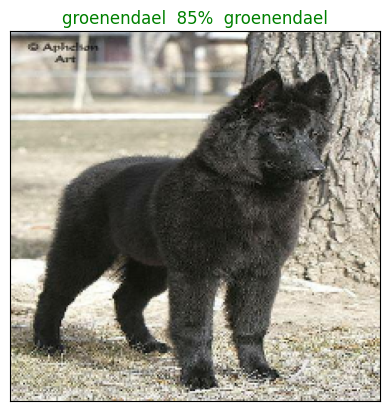

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=45)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the predicction using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅

* Plot the top 10 prediction probability values and labels, coloring the true label green. ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidences indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plit
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")

  # Change the color of the true labal
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

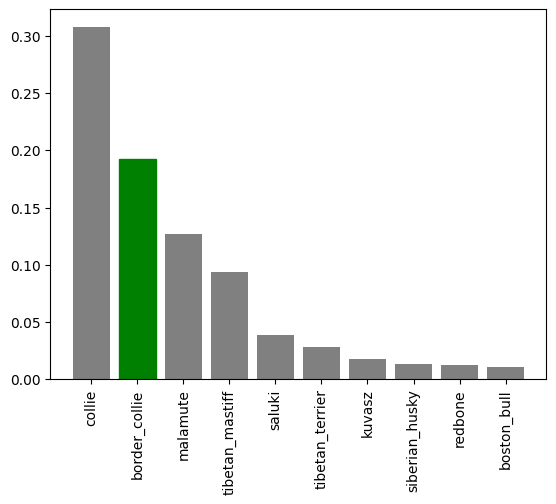

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

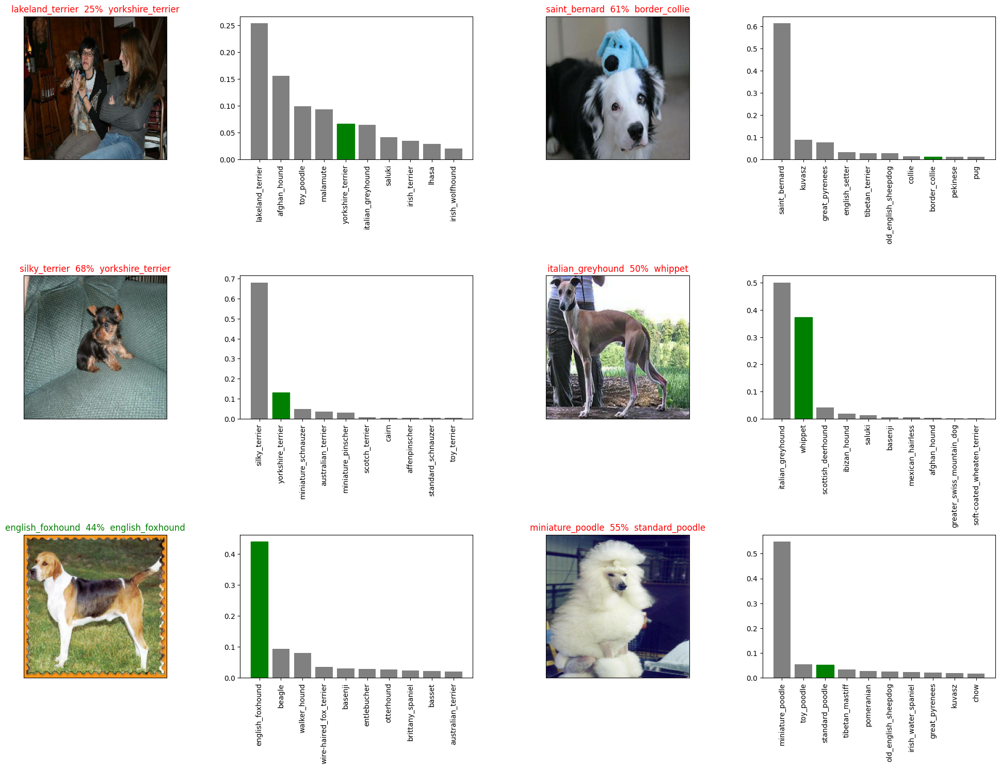

In [ ]:
# Let's check out a few predictions and their different values.
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_cols*num_rows
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
               plt.subplot(num_rows, 2*num_cols, 2*i+1)
               plot_pred(prediction_probabilities = predictions,
                         labels = val_labels,
                         images = val_images,
                         n=i+i_multiplier)
               plt.subplot(num_rows, 2*num_cols, 2*i+2)
               plot_pred_conf(prediction_probabilities=predictions,
                              labels = val_labels,
                              n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge yet to be done**

Create a confusion matrix where you compare the predicted labels vs. the true_labels

Text(0.5, 1.0, 'Confusion Matrix for Dog Vision 🐶')

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Glyph 128054 (\N{DOG FACE}) missing from current font.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128054 (\N{DOG FACE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


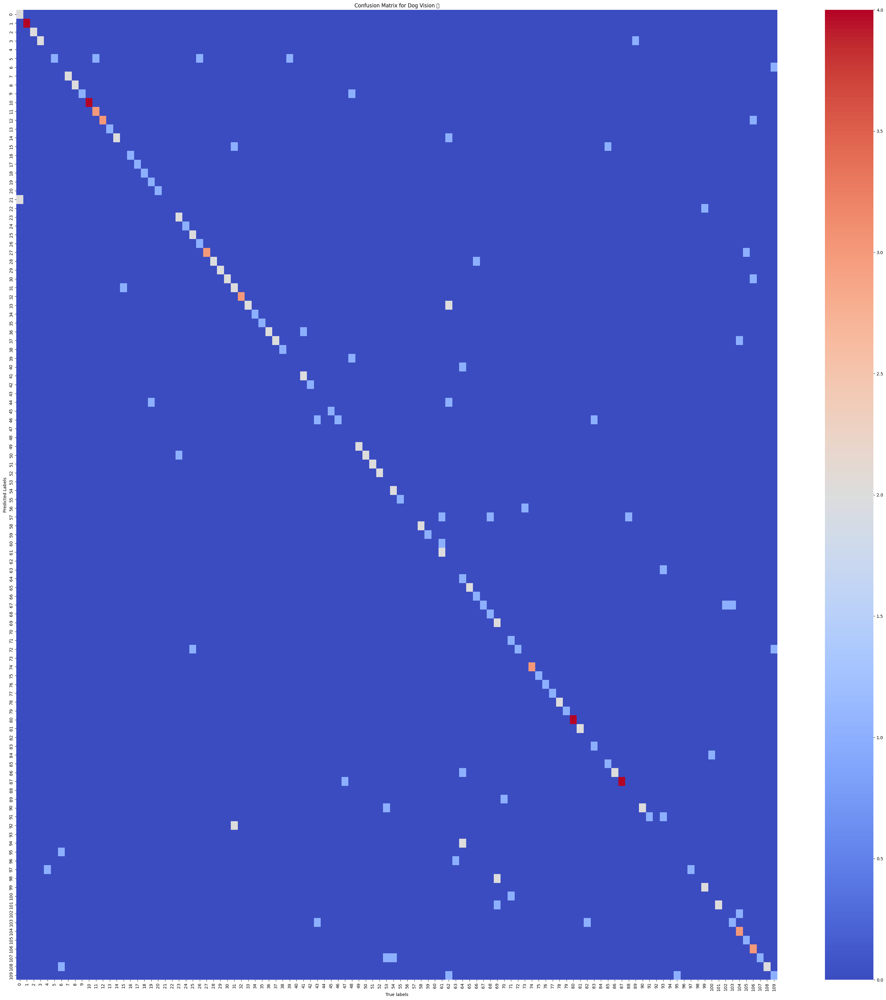

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_preds = np.array([get_pred_label(p) for p in predictions]) # get the predicted labels

conf_matrix = confusion_matrix(val_labels, y_preds)

plt.figure(figsize=(40, 41))
sns.heatmap(conf_matrix, cmap='coolwarm')

plt.ylabel('Predicted Labels')
plt.xlabel('True labels')

# plt.xticks(ticks=np.arange(120), labels=unique_breeds)  # plot the breed name on axis
# plt.yticks(ticks=np.arange(120), labels=unique_breeds, rotation='horizontal')

plt.title('Confusion Matrix for Dog Vision 🐶')

## Saving a reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appens a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20240421-11031713697421-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240421-11031713697421-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Dog Vision/models/20240415-18181713205090-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20240415-18181713205090-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluating the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 110ms/step - loss: 1.2793 - accuracy: 0.6850


[1.2792930603027344, 0.6850000023841858]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 155ms/step - loss: 1.2694 - accuracy: 0.6500


[1.2694107294082642, 0.6499999761581421]

## Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No valudation set wgen training on all the data, so we can't monitor valudation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 62s 179ms/step - loss: 1.3278 - accuracy: 0.6725
Epoch 2/100
320/320 [==============================] - 61s 190ms/step - loss: 0.3986 - accuracy: 0.8832
Epoch 3/100
320/320 [==============================] - 60s 187ms/step - loss: 0.2373 - accuracy: 0.9353
Epoch 4/100
320/320 [==============================] - 66s 206ms/step - loss: 0.1526 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 57s 177ms/step - loss: 0.1055 - accuracy: 0.9796
Epoch 6/100
320/320 [==============================] - 62s 195ms/step - loss: 0.0778 - accuracy: 0.9851
Epoch 7/100
320/320 [==============================] - 58s 182ms/step - loss: 0.0586 - accuracy: 0.9928
Epoch 8/100
320/320 [==============================] - 46s 144ms/step - loss: 0.0458 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 60s 186ms/step - loss: 0.0383 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 57s 177m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20240421-11221713698533-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20240421-11221713698533-full-image-set-mobilenetv2-Adam.h5'

## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data bacthes using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e8fcfd7898f198f6efe756a6f93bc0fc.jpg',
 'drive/MyDrive/Dog Vision/test/e8f67d8d36c49d7436aab680e798b685.jpg',
 'drive/MyDrive/Dog Vision/test/e806fbb5ca4dd3a094f7819bd810cc65.jpg',
 'drive/MyDrive/Dog Vision/test/e816f0027a2c6348dbf12b79c70541bc.jpg',
 'drive/MyDrive/Dog Vision/test/e85291fc6ba44e39defc7769fa020646.jpg',
 'drive/MyDrive/Dog Vision/test/e89d149b27db1f144ca122bb29b8ab9f.jpg',
 'drive/MyDrive/Dog Vision/test/e8e5d64a1789dd86009b07003bed090b.jpg',
 'drive/MyDrive/Dog Vision/test/e806a67a05289ac6de6831001664b81b.jpg',
 'drive/MyDrive/Dog Vision/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 'drive/MyDrive/Dog Vision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, y=None, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about ~ 1 hour).

In [ ]:
# Make predictions on test data batch using the full loaded model
test_predictions = full_model.predict(test_data,
                                      verbose = 1)

324/324 [==============================] - 276s 841ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for acces later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.26325613e-13, 4.56783222e-11, 4.12616339e-12, ...,
        1.76032344e-08, 6.40309628e-09, 6.29525783e-13],
       [4.60569645e-08, 1.07461453e-08, 4.13326227e-08, ...,
        1.07925736e-07, 7.64283759e-05, 3.39202529e-07],
       [2.10806718e-07, 7.46771800e-09, 3.22692060e-08, ...,
        5.36115117e-08, 9.88037467e-01, 1.90849987e-05],
       ...,
       [6.65739733e-15, 1.01620526e-06, 1.02097818e-11, ...,
        2.21591301e-09, 7.71312593e-13, 6.43153239e-12],
       [3.02778062e-07, 2.57997530e-12, 3.62709973e-10, ...,
        5.33225908e-10, 4.11848611e-10, 1.00406456e-08],
       [1.92910594e-08, 2.49943466e-09, 1.13059437e-08, ...,
        2.41057441e-09, 2.97297387e-09, 3.63160968e-09]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a Pandas dataframe with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a Pandas DataFrame
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8fcfd7898f198f6efe756a6f93bc0fc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e8f67d8d36c49d7436aab680e798b685,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e806fbb5ca4dd3a094f7819bd810cc65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e816f0027a2c6348dbf12b79c70541bc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e85291fc6ba44e39defc7769fa020646,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,0854e34e53c9dd84579d4c37086dbdf5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,078a52db2d156257696c771487a6a316,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,07737ae303594890f1ba38b87399ba40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,07f36df95c5fc473f2fbf51c0929ee7d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8fcfd7898f198f6efe756a6f93bc0fc,1.263256e-13,4.567832e-11,4.126163e-12,1.323079e-12,3.402742e-09,9.726729e-10,3.018906e-11,1.276014e-05,1.341438e-08,...,1.717259e-11,3.385005e-09,1.268685e-08,4.612905e-11,1.306261e-09,5.414226e-10,4.713029e-11,1.760323e-08,6.403096e-09,6.295258e-13
1,e8f67d8d36c49d7436aab680e798b685,4.605696e-08,1.074615e-08,4.133262e-08,1.448862e-12,1.792928e-07,1.479683e-08,5.217088e-07,3.522397e-08,1.635076e-08,...,7.957700e-12,1.729490e-08,5.798874e-11,6.637048e-08,1.489484e-08,1.570115e-08,9.967513e-01,1.079257e-07,7.642838e-05,3.392025e-07
2,e806fbb5ca4dd3a094f7819bd810cc65,2.108067e-07,7.467718e-09,3.226921e-08,3.699383e-04,2.803827e-08,3.279074e-09,1.591324e-05,2.681157e-08,3.234287e-10,...,2.546131e-07,2.464511e-08,4.852849e-07,7.054967e-08,1.934205e-09,1.473717e-07,7.536132e-08,5.361151e-08,9.880375e-01,1.908500e-05
3,e816f0027a2c6348dbf12b79c70541bc,1.728128e-09,8.695705e-11,1.881457e-11,2.938981e-11,3.320321e-13,2.117241e-14,4.683596e-15,9.810205e-15,1.450216e-11,...,5.911351e-13,4.389107e-13,2.829517e-16,7.772562e-17,3.496869e-15,5.222125e-13,9.914446e-09,2.458687e-13,1.536835e-10,3.094759e-11
4,e85291fc6ba44e39defc7769fa020646,7.056800e-10,5.335044e-08,5.812023e-06,1.752816e-07,9.352514e-08,3.497910e-06,4.172555e-10,1.102813e-08,5.938111e-06,...,5.735571e-07,1.786275e-06,7.534164e-03,1.038849e-07,8.617810e-05,2.813538e-08,3.329174e-08,8.756577e-03,2.880547e-10,1.489689e-08


In [ ]:
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

## Making predicions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our custom images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predicion labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)if fname.lower().endswith('.jpg')]  # Filter for JPG files]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/staffordshire_bull_terrier.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/1200px-Staffie.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/9105821-engels-staffordshire-bull-terrier-staffordshire-stafy-staffie-stafford-liggend-op-de-vloer.jpg']

In [ ]:
# Turn custom images into batch Datasets
custom_data = create_data_batches(custom_image_paths, y=None, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['american_staffordshire_terrier',
 'staffordshire_bullterrier',
 'american_staffordshire_terrier']

In [ ]:
# Get the custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

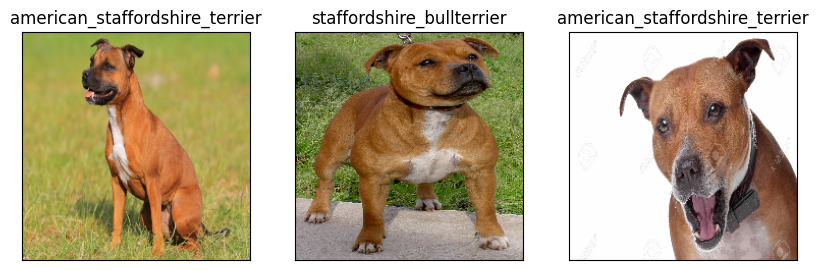

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)